# Video Search with Azure Computer Vision 4 (Florence)
## 4 Search using an image or a prompt

![image](logo.jpg)

In [1]:
import datetime
import glob
import json
import os
import sys

from azure import (
    get_results_using_image,
    get_results_using_prompt,
    get_similar_images_using_prompt,
    remove_background,
    side_by_side_images,
    view_image,
)

from dotenv import load_dotenv
from PIL import Image

## 1. Informations

In [2]:
sys.version

'3.8.5 (default, Sep  4 2020, 07:30:14) \n[GCC 7.3.0]'

In [3]:
print("Today is", datetime.datetime.today())

Today is 2023-05-15 11:37:08.549651


## 2. Frames

In [4]:
IMAGES_DIR = "frames"

In [5]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: frames
Total number of catalog images = 1,448


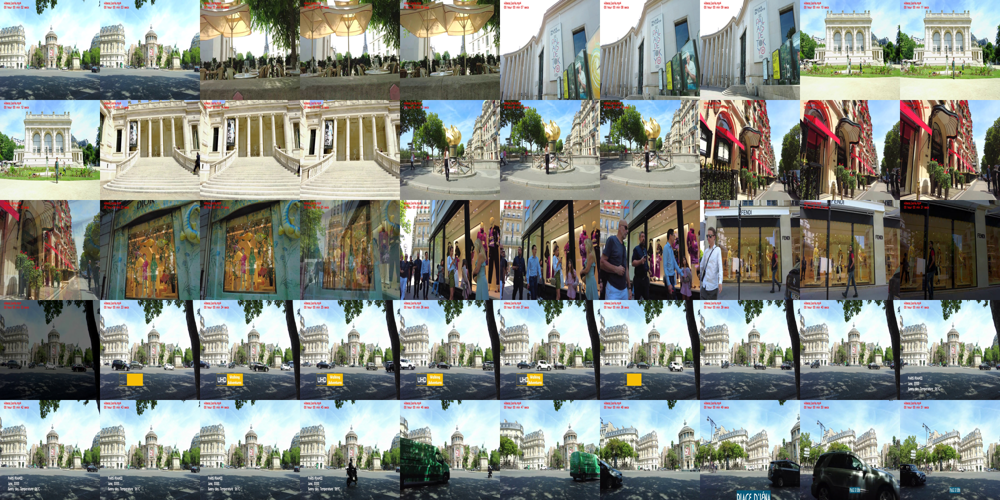

In [6]:
num_images_per_row = 10
num_images_per_col = 5

img_size = 200
start = 1
samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

for idx, image_file in enumerate(samples):
    img = Image.open(image_file)
    img = img.resize((img_size, img_size))
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

In [7]:
load_dotenv("azure.env")

key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

## 3. Loading vector embeddings

In [8]:
JSON_DIR = "json"

glob.glob(JSON_DIR + "/*.json")

['json/img_embed_15May2023_113615.json']

In [9]:
print("Importing vectors embeddings...")

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_15May2023_113615.json

Done: number of imported vector embeddings = 1,448


## 4. Visual search using a field image

We can use a reference image and find the most similar images.
In this demo we will use the reference image without its background
(Azure Computer Vision 4 can automatically remove the background). 
The search will be made using the image without its background.

In [10]:
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Total number of catalog images = 1,448


In [11]:
TEST_DIR = "images"

test_images = glob.glob(f"{TEST_DIR}/*")
print(f"Total number of test images = {len(test_images)}")

Total number of test images = 10


### Test 1

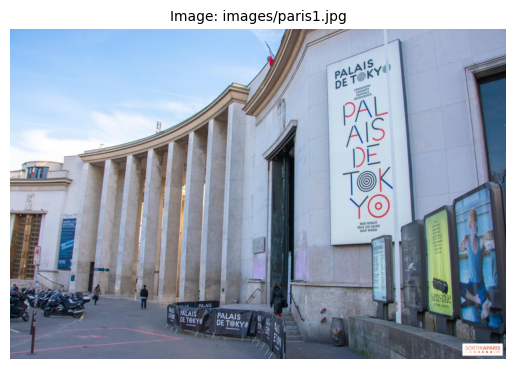

In [12]:
reference_image = test_images[0]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


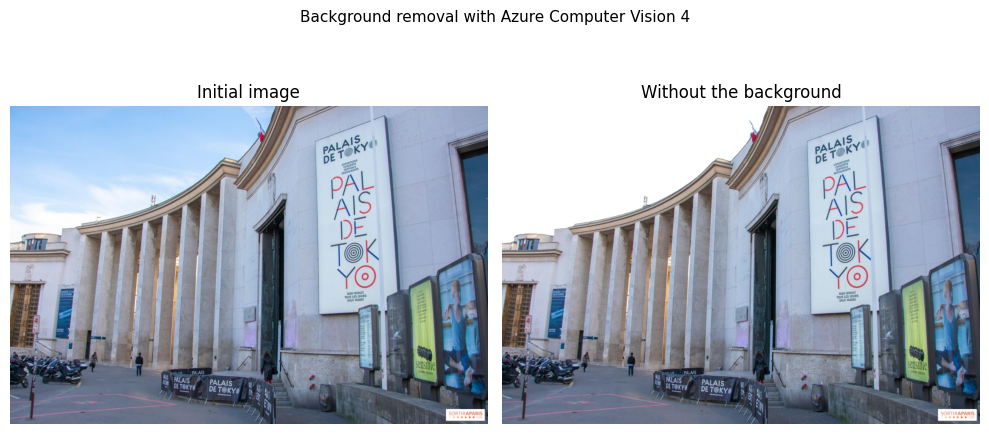

In [13]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_00_03_23.jpg with similarity index = 0.8195964179154579
002 frames/frame_00_00_09.jpg with similarity index = 0.8051824065232472
003 frames/frame_00_03_22.jpg with similarity index = 0.8017943143257545
004 frames/frame_00_03_24.jpg with similarity index = 0.7915721856417943
005 frames/frame_00_03_26.jpg with similarity index = 0.784129785613215
006 frames/frame_00_03_25.jpg with similarity index = 0.7829515175774189


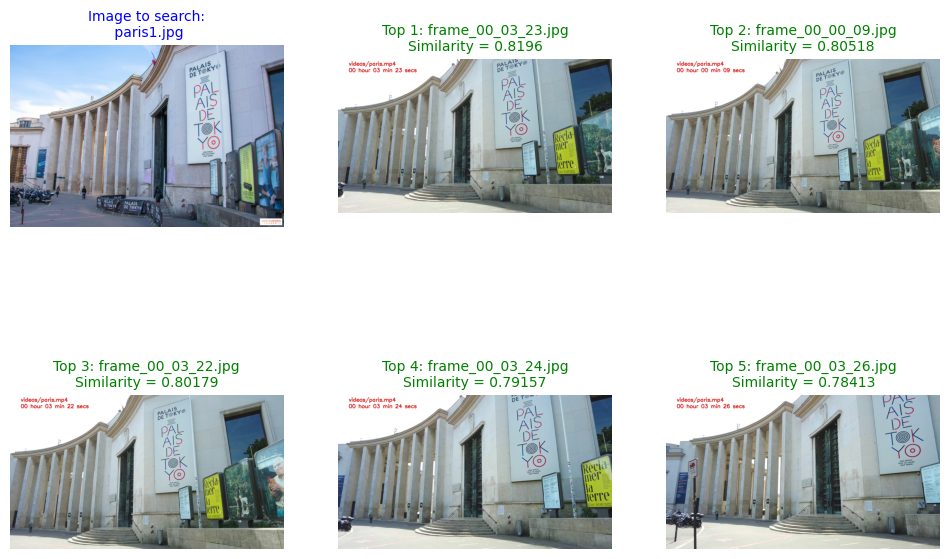

 2023-05-15 11:37:28 Powered by Azure Computer Vision Florence


,image_file,similarity
202,frames/frame_00_03_23.jpg,0.819596
8,frames/frame_00_00_09.jpg,0.805182
201,frames/frame_00_03_22.jpg,0.801794
203,frames/frame_00_03_24.jpg,0.791572
205,frames/frame_00_03_26.jpg,0.784130
...,...,...
1294,frames/frame_00_21_35.jpg,0.289199
807,frames/frame_00_13_28.jpg,0.288290
1238,frames/frame_00_20_39.jpg,0.285979
1292,frames/frame_00_21_33.jpg,0.281577


In [14]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 2

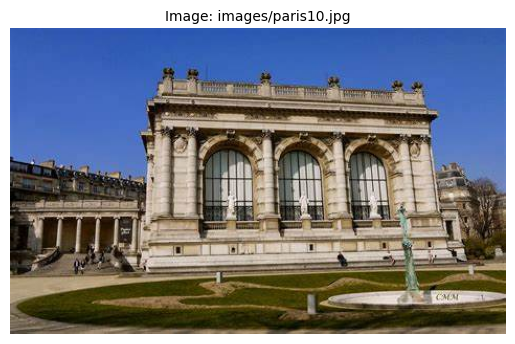

In [15]:
reference_image = test_images[1]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


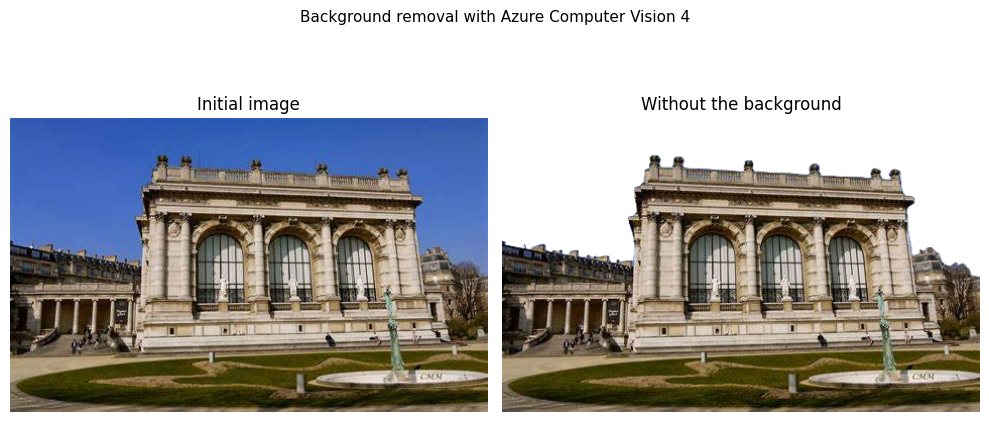

In [16]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_00_10_28.jpg with similarity index = 0.8255429191018042
002 frames/frame_00_10_01.jpg with similarity index = 0.8195173957903268
003 frames/frame_00_05_52.jpg with similarity index = 0.8162276297868196
004 frames/frame_00_10_02.jpg with similarity index = 0.8151501665119124
005 frames/frame_00_10_03.jpg with similarity index = 0.8119081000844637
006 frames/frame_00_05_51.jpg with similarity index = 0.8102474065019837


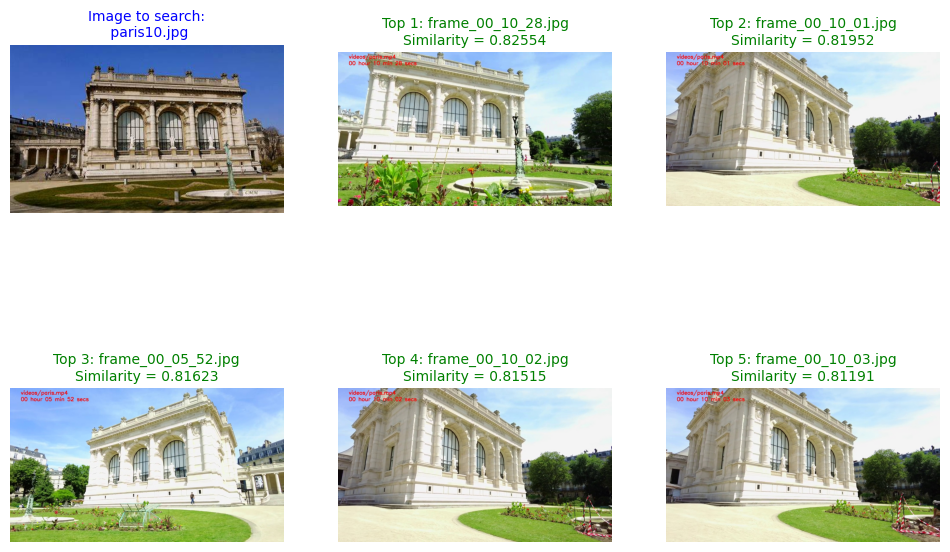

 2023-05-15 11:37:33 Powered by Azure Computer Vision Florence


,image_file,similarity
627,frames/frame_00_10_28.jpg,0.825543
600,frames/frame_00_10_01.jpg,0.819517
351,frames/frame_00_05_52.jpg,0.816228
601,frames/frame_00_10_02.jpg,0.815150
602,frames/frame_00_10_03.jpg,0.811908
...,...,...
1288,frames/frame_00_21_29.jpg,0.260898
1126,frames/frame_00_18_47.jpg,0.258990
1291,frames/frame_00_21_32.jpg,0.254523
1269,frames/frame_00_21_10.jpg,0.253730


In [17]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 3

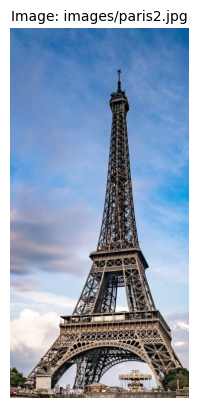

In [18]:
reference_image = test_images[2]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


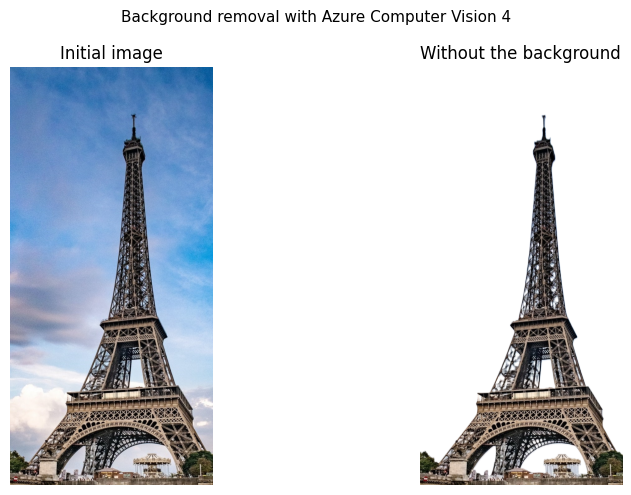

In [19]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_00_00_04.jpg with similarity index = 0.6065063986762228
002 frames/frame_00_08_12.jpg with similarity index = 0.6039766181022816
003 frames/frame_00_02_36.jpg with similarity index = 0.5970346375495359
004 frames/frame_00_08_06.jpg with similarity index = 0.5947264893660523
005 frames/frame_00_02_38.jpg with similarity index = 0.5917421908178732
006 frames/frame_00_08_08.jpg with similarity index = 0.5900463969578073


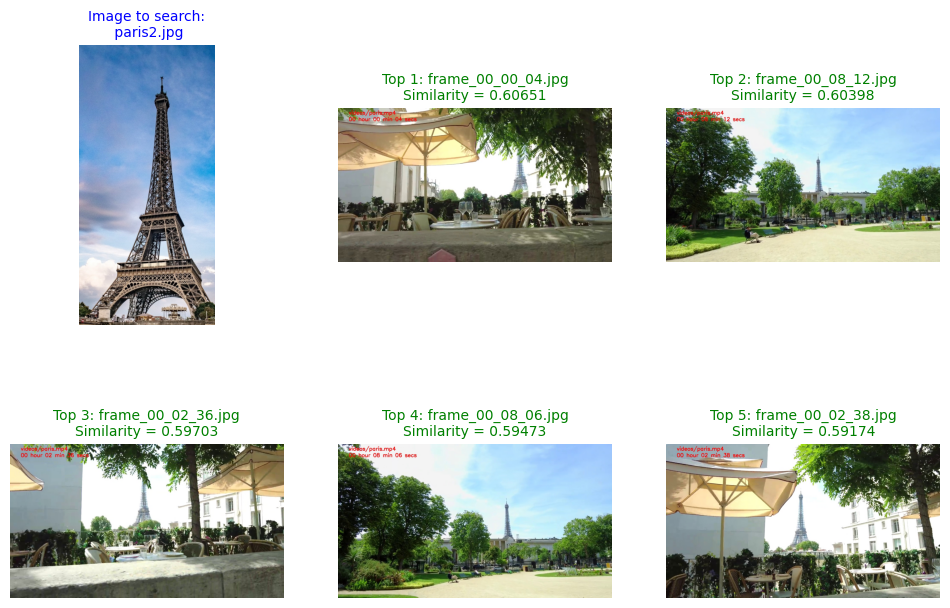

 2023-05-15 11:37:41 Powered by Azure Computer Vision Florence


,image_file,similarity
3,frames/frame_00_00_04.jpg,0.606506
491,frames/frame_00_08_12.jpg,0.603977
155,frames/frame_00_02_36.jpg,0.597035
485,frames/frame_00_08_06.jpg,0.594726
157,frames/frame_00_02_38.jpg,0.591742
...,...,...
836,frames/frame_00_13_57.jpg,0.267696
1125,frames/frame_00_18_46.jpg,0.266667
1122,frames/frame_00_18_43.jpg,0.248182
914,frames/frame_00_15_15.jpg,0.247162


In [20]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 4

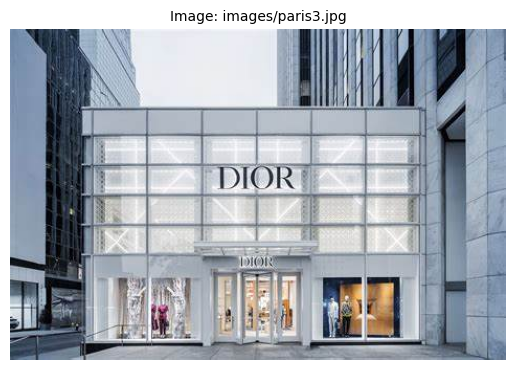

In [21]:
reference_image = test_images[3]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


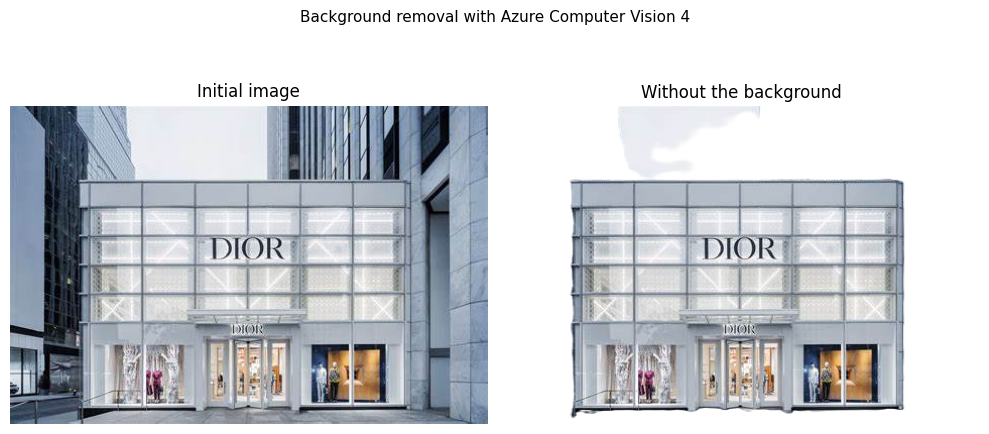

In [22]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 6 images:

001 frames/frame_00_19_37.jpg with similarity index = 0.7597506190011771
002 frames/frame_00_19_38.jpg with similarity index = 0.7319651737506572
003 frames/frame_00_19_31.jpg with similarity index = 0.727430119321049
004 frames/frame_00_19_30.jpg with similarity index = 0.71765958695989
005 frames/frame_00_19_32.jpg with similarity index = 0.7142130351240515
006 frames/frame_00_19_36.jpg with similarity index = 0.7021100999175568


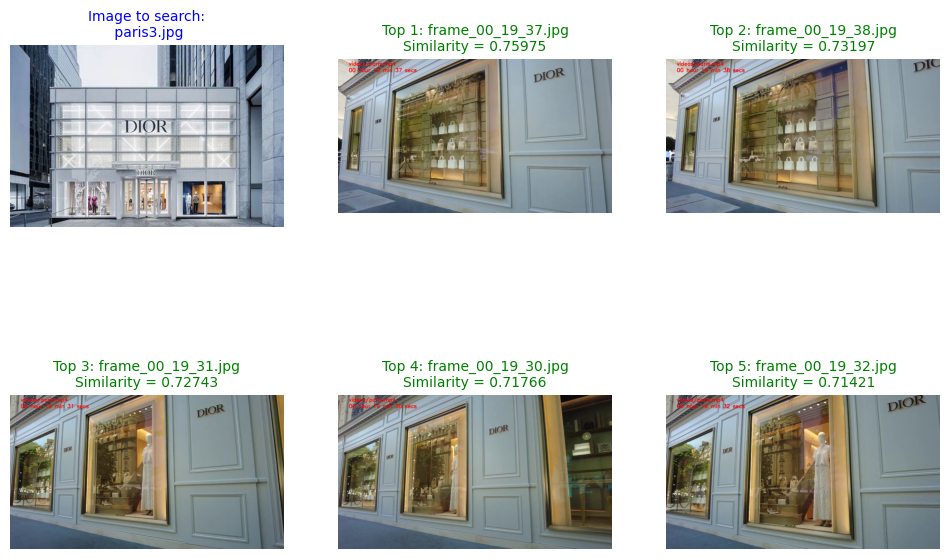

 2023-05-15 11:37:46 Powered by Azure Computer Vision Florence


,image_file,similarity
1176,frames/frame_00_19_37.jpg,0.759751
1177,frames/frame_00_19_38.jpg,0.731965
1170,frames/frame_00_19_31.jpg,0.727430
1169,frames/frame_00_19_30.jpg,0.717660
1171,frames/frame_00_19_32.jpg,0.714213
...,...,...
694,frames/frame_00_11_35.jpg,0.210806
420,frames/frame_00_07_01.jpg,0.209478
421,frames/frame_00_07_02.jpg,0.208308
870,frames/frame_00_14_31.jpg,0.200867


In [23]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=6, disp=True
)

### Test 5

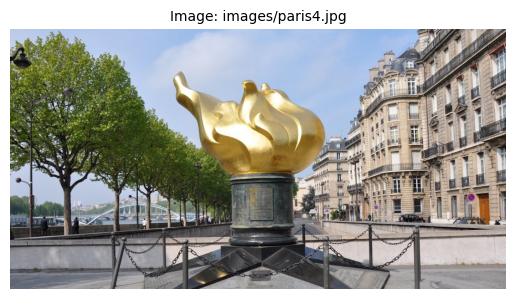

In [24]:
reference_image = test_images[4]

view_image(reference_image)

Removing background from the image using Azure Computer Vision 4.0...
Done


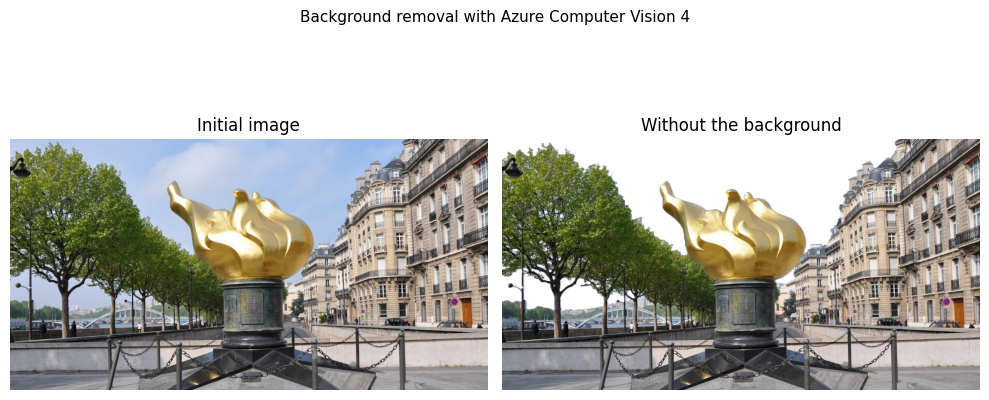

In [25]:
nobackground_image = remove_background(reference_image)
side_by_side_images(reference_image, nobackground_image)

Top 3 images:

001 frames/frame_00_11_52.jpg with similarity index = 0.8123265317889943
002 frames/frame_00_11_20.jpg with similarity index = 0.8045589535598359
003 frames/frame_00_00_17.jpg with similarity index = 0.7884810815592769


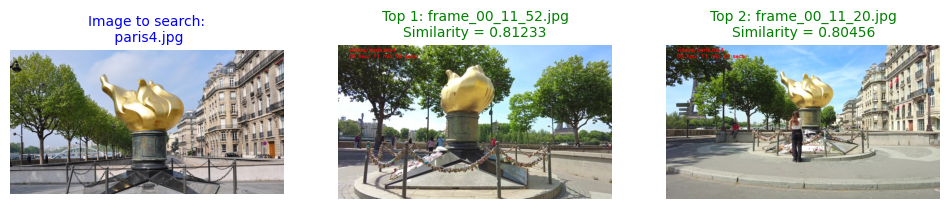

 2023-05-15 11:37:52 Powered by Azure Computer Vision Florence


,image_file,similarity
711,frames/frame_00_11_52.jpg,0.812327
679,frames/frame_00_11_20.jpg,0.804559
16,frames/frame_00_00_17.jpg,0.788481
678,frames/frame_00_11_19.jpg,0.784010
17,frames/frame_00_00_18.jpg,0.780766
...,...,...
229,frames/frame_00_03_50.jpg,0.299935
1122,frames/frame_00_18_43.jpg,0.298289
1289,frames/frame_00_21_30.jpg,0.295629
1288,frames/frame_00_21_29.jpg,0.294726


In [26]:
get_results_using_image(
    reference_image, nobackground_image, image_files, list_emb, topn=3, disp=True
)

## 5. Visual search using some text

We can use some prompt (text) to find some articles in our catalog images.

### Test 1

In [27]:
query = "person wearing a mask"


Similar images using query = person wearing a mask


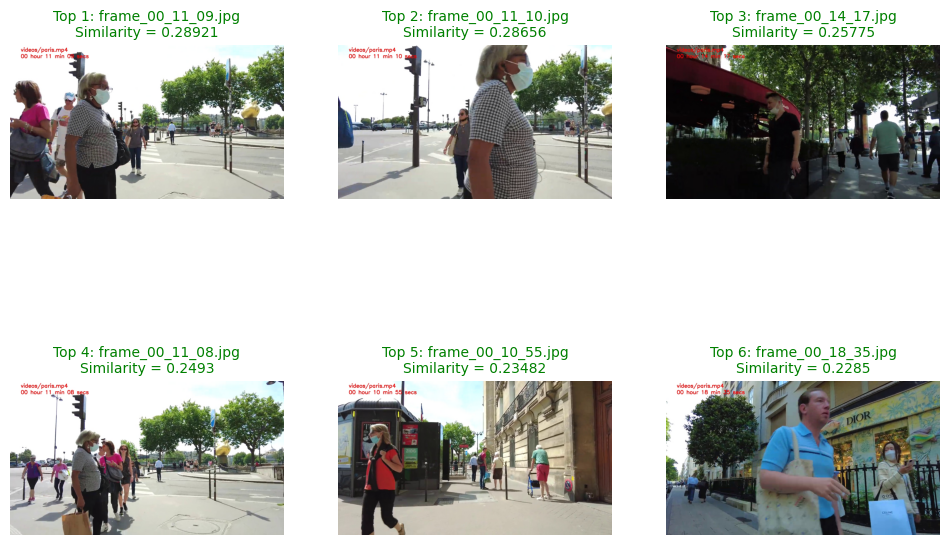

 2023-05-15 11:37:55 Powered by Azure Computer Vision Florence


,image_file,similarity
668,frames/frame_00_11_09.jpg,0.289212
669,frames/frame_00_11_10.jpg,0.286558
856,frames/frame_00_14_17.jpg,0.257751
667,frames/frame_00_11_08.jpg,0.249300
654,frames/frame_00_10_55.jpg,0.234824
...,...,...
1058,frames/frame_00_17_39.jpg,0.072968
40,frames/frame_00_00_41.jpg,0.072771
42,frames/frame_00_00_43.jpg,0.072331
525,frames/frame_00_08_46.jpg,0.070676


In [28]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 2

In [29]:
query = "palais de tokyo"


Similar images using query = palais de tokyo


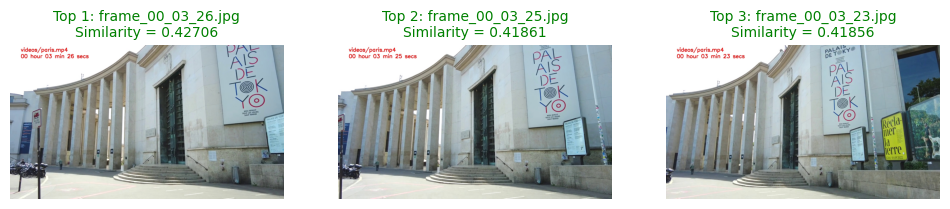

 2023-05-15 11:38:04 Powered by Azure Computer Vision Florence


,image_file,similarity
205,frames/frame_00_03_26.jpg,0.427055
204,frames/frame_00_03_25.jpg,0.418613
202,frames/frame_00_03_23.jpg,0.418557
203,frames/frame_00_03_24.jpg,0.403437
197,frames/frame_00_03_18.jpg,0.400545
...,...,...
976,frames/frame_00_16_17.jpg,0.109558
993,frames/frame_00_16_34.jpg,0.101122
1025,frames/frame_00_17_06.jpg,0.099088
19,frames/frame_00_00_20.jpg,0.095886


In [30]:
get_results_using_prompt(query, image_files, list_emb, topn=3, disp=False)

### Test 3

In [35]:
query = "pink lines on the ground"


Similar images using query = pink lines on the ground


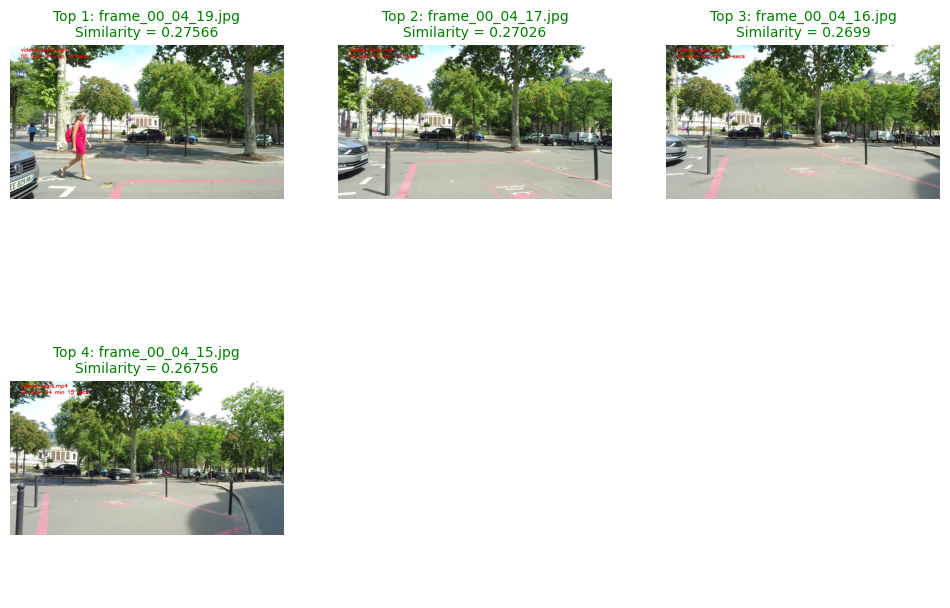

 2023-05-15 11:39:00 Powered by Azure Computer Vision Florence


,image_file,similarity
258,frames/frame_00_04_19.jpg,0.275659
256,frames/frame_00_04_17.jpg,0.270264
255,frames/frame_00_04_16.jpg,0.269896
254,frames/frame_00_04_15.jpg,0.267557
583,frames/frame_00_09_44.jpg,0.241566
...,...,...
1131,frames/frame_00_18_52.jpg,0.104534
1130,frames/frame_00_18_51.jpg,0.103702
640,frames/frame_00_10_41.jpg,0.102868
1189,frames/frame_00_19_50.jpg,0.101107


In [37]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 4

In [38]:
query = "eiffel tower"


Similar images using query = eiffel tower


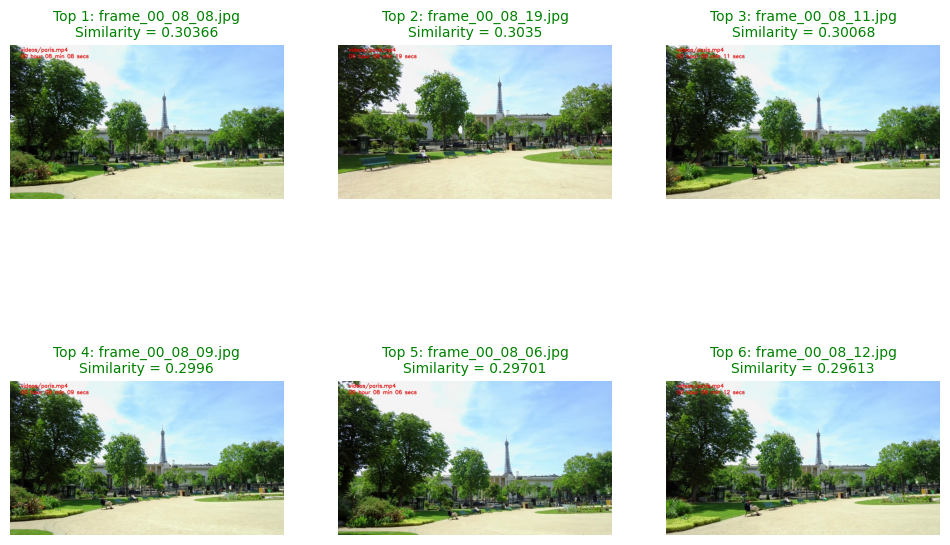

 2023-05-15 11:39:09 Powered by Azure Computer Vision Florence


,image_file,similarity
487,frames/frame_00_08_08.jpg,0.303659
498,frames/frame_00_08_19.jpg,0.303497
490,frames/frame_00_08_11.jpg,0.300684
488,frames/frame_00_08_09.jpg,0.299597
485,frames/frame_00_08_06.jpg,0.297005
...,...,...
1332,frames/frame_00_22_13.jpg,0.165723
1290,frames/frame_00_21_31.jpg,0.161870
1294,frames/frame_00_21_35.jpg,0.160637
911,frames/frame_00_15_12.jpg,0.155178


In [39]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 5

In [40]:
query = "monument with a flame"


Similar images using query = monument with a flame


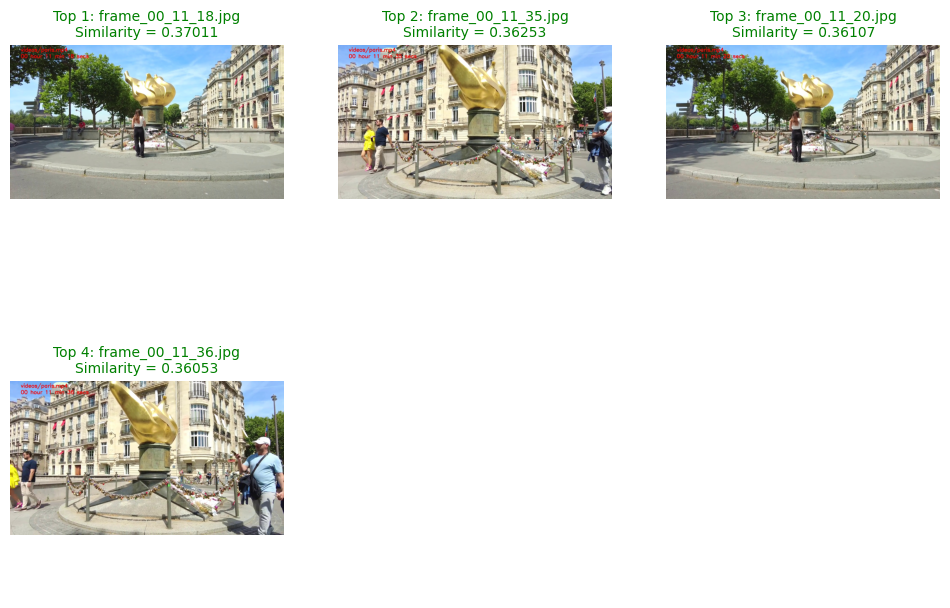

 2023-05-15 11:39:11 Powered by Azure Computer Vision Florence


,image_file,similarity
677,frames/frame_00_11_18.jpg,0.370114
694,frames/frame_00_11_35.jpg,0.362527
679,frames/frame_00_11_20.jpg,0.361071
695,frames/frame_00_11_36.jpg,0.360530
17,frames/frame_00_00_18.jpg,0.359186
...,...,...
23,frames/frame_00_00_24.jpg,0.092426
1290,frames/frame_00_21_31.jpg,0.089180
1179,frames/frame_00_19_40.jpg,0.086664
1292,frames/frame_00_21_33.jpg,0.086493


In [41]:
get_results_using_prompt(query, image_files, list_emb, topn=4, disp=False)

### Test 6

In [42]:
query = "dior store"


Similar images using query = dior store


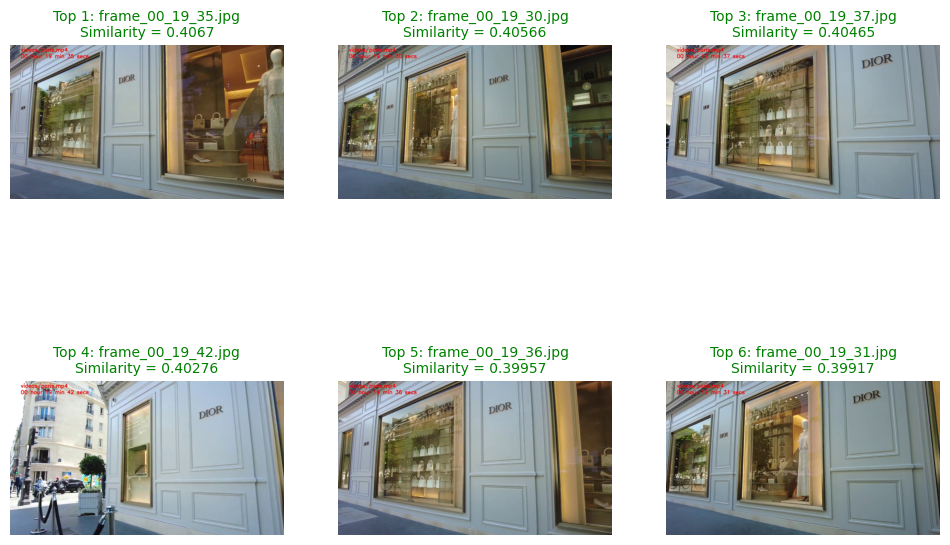

 2023-05-15 11:39:20 Powered by Azure Computer Vision Florence


,image_file,similarity
1174,frames/frame_00_19_35.jpg,0.406697
1169,frames/frame_00_19_30.jpg,0.405661
1176,frames/frame_00_19_37.jpg,0.404652
1181,frames/frame_00_19_42.jpg,0.402761
1175,frames/frame_00_19_36.jpg,0.399567
...,...,...
526,frames/frame_00_08_47.jpg,0.144031
510,frames/frame_00_08_31.jpg,0.141808
637,frames/frame_00_10_38.jpg,0.140919
531,frames/frame_00_08_52.jpg,0.133623


In [43]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 7

In [44]:
query = "outdoor restaurant"


Similar images using query = outdoor restaurant


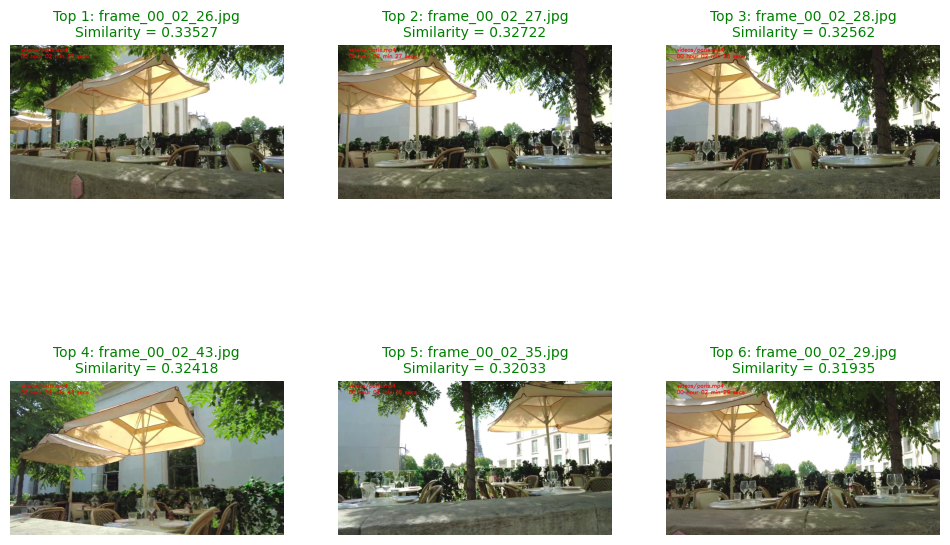

 2023-05-15 11:39:37 Powered by Azure Computer Vision Florence


,image_file,similarity
145,frames/frame_00_02_26.jpg,0.335269
146,frames/frame_00_02_27.jpg,0.327219
147,frames/frame_00_02_28.jpg,0.325616
162,frames/frame_00_02_43.jpg,0.324185
154,frames/frame_00_02_35.jpg,0.320335
...,...,...
420,frames/frame_00_07_01.jpg,0.116242
432,frames/frame_00_07_13.jpg,0.114756
433,frames/frame_00_07_14.jpg,0.114544
431,frames/frame_00_07_12.jpg,0.113989


In [46]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 8

In [47]:
query = "garden"


Similar images using query = garden


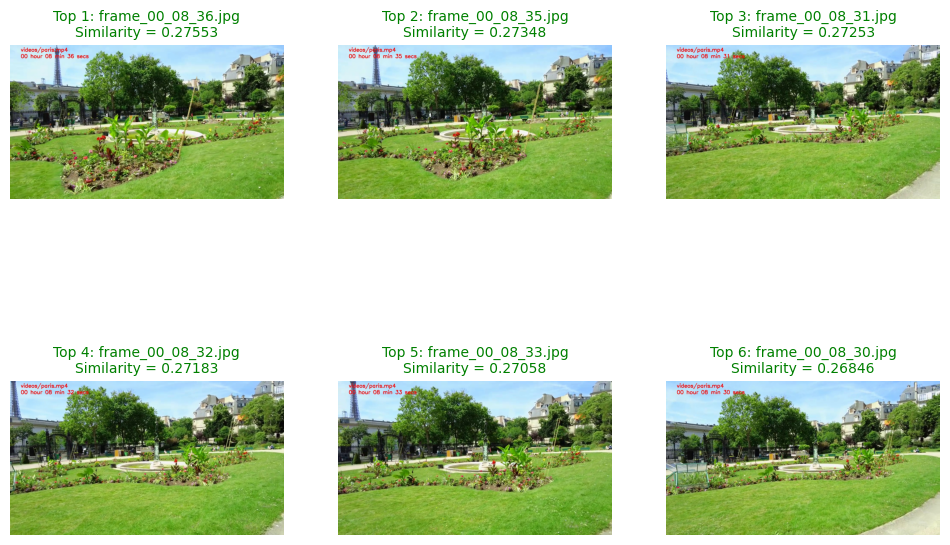

 2023-05-15 11:39:44 Powered by Azure Computer Vision Florence


,image_file,similarity
515,frames/frame_00_08_36.jpg,0.275535
514,frames/frame_00_08_35.jpg,0.273478
510,frames/frame_00_08_31.jpg,0.272531
511,frames/frame_00_08_32.jpg,0.271833
512,frames/frame_00_08_33.jpg,0.270577
...,...,...
1177,frames/frame_00_19_38.jpg,0.112740
1292,frames/frame_00_21_33.jpg,0.111554
25,frames/frame_00_00_26.jpg,0.110612
27,frames/frame_00_00_28.jpg,0.109906


In [48]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

### Test 9

In [49]:
query = "busy street"

Top 6 images:

001 frames/frame_00_12_44.jpg with similarity index = 0.3309964961576843
002 frames/frame_00_12_46.jpg with similarity index = 0.32194042137903073
003 frames/frame_00_12_42.jpg with similarity index = 0.3172292072891196
004 frames/frame_00_12_45.jpg with similarity index = 0.312263307352922
005 frames/frame_00_12_52.jpg with similarity index = 0.3076357005184265
006 frames/frame_00_12_47.jpg with similarity index = 0.30691066113008236

Similar images using query = busy street


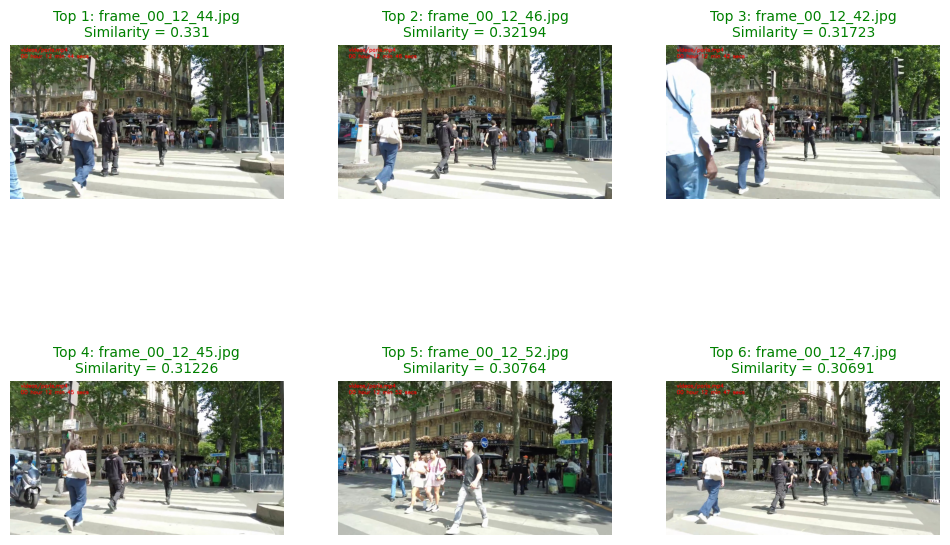

 2023-05-15 11:39:52 Powered by Azure Computer Vision Florence


,image_file,similarity
763,frames/frame_00_12_44.jpg,0.330996
765,frames/frame_00_12_46.jpg,0.321940
761,frames/frame_00_12_42.jpg,0.317229
764,frames/frame_00_12_45.jpg,0.312263
771,frames/frame_00_12_52.jpg,0.307636
...,...,...
416,frames/frame_00_06_57.jpg,0.080076
432,frames/frame_00_07_13.jpg,0.078657
428,frames/frame_00_07_09.jpg,0.077631
431,frames/frame_00_07_12.jpg,0.074011


In [50]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=True)

### Test 10

In [51]:
query = "empty street"


Similar images using query = empty street


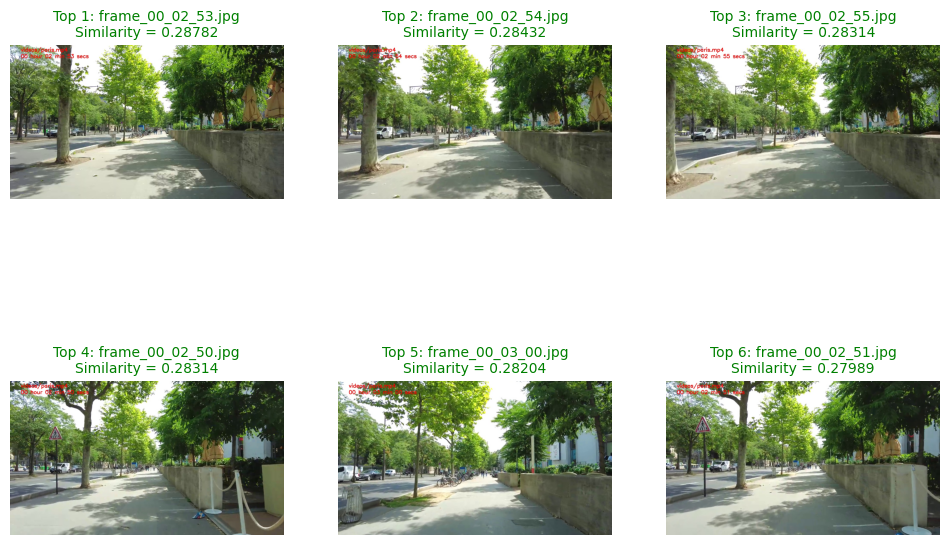

 2023-05-15 11:39:58 Powered by Azure Computer Vision Florence


,image_file,similarity
172,frames/frame_00_02_53.jpg,0.287823
173,frames/frame_00_02_54.jpg,0.284317
174,frames/frame_00_02_55.jpg,0.283144
169,frames/frame_00_02_50.jpg,0.283141
179,frames/frame_00_03_00.jpg,0.282040
...,...,...
431,frames/frame_00_07_12.jpg,0.118957
1130,frames/frame_00_18_51.jpg,0.115729
1132,frames/frame_00_18_53.jpg,0.115613
23,frames/frame_00_00_24.jpg,0.112761


In [52]:
get_results_using_prompt(query, image_files, list_emb, topn=6, disp=False)

> In the next notebook we will create a webapp with Gradio